# Crop, Weed & Soil Instance Segmentation — YOLOv8

This notebook trains a YOLOv8 instance segmentation model on **two merged COCO datasets**.

| Dataset | Images | Source folder |
|---------|--------|---------------|
| bean-soil-seg | 65 | `bean-soil-seg.coco-segmentation/train/` |
| weed-soil-seg | 21 | `weed-soil-seg.coco-segmentation/train/` |

**Class mapping (3 classes):**

| YOLO class | Name | Source |
|------------|------|--------|
| 0 | **crop** | `bean-soil-seg` → category `plant` (id=1) |
| 1 | **weed** | `weed-soil-seg` → category `plant` (id=1) |
| 2 | **soil** | **both** datasets → category `soil` (id=2) |

Annotations are stored as a single `_annotations.coco.json` per dataset split (RLE mask format).

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install -q ultralytics opencv-python matplotlib numpy pillow
!pip install -q pycocotools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.9 MB/s eta 0:00:00


In [3]:
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
import shutil
from PIL import Image
from pycocotools import mask as coco_mask
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Mount Google Drive
All outputs (dataset, weights, metrics) are saved to Drive so they persist between sessions.

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# ── Where all outputs are saved ──────────────────────────────────────────────
model_results_dir = Path('/content/drive/MyDrive/new_model_results')
os.makedirs(model_results_dir, exist_ok=True)

# ── Source dataset folders (adjust if your Drive structure is different) ──────
BEAN_SOIL_DIR = Path('/content/drive/MyDrive/new_data_seg/bean-soil-seg.coco-segmentation/train')
WEED_SOIL_DIR = Path('/content/drive/MyDrive/new_data_seg/weed-soil-seg.coco-segmentation/train')

print(f'Outputs   → {model_results_dir}')
print(f'Crop data → {BEAN_SOIL_DIR}')
print(f'Weed data → {WEED_SOIL_DIR}')

Outputs   → /content/drive/MyDrive/new_model_results
Crop data → /content/drive/MyDrive/new_data_seg/bean-soil-seg.coco-segmentation/train
Weed data → /content/drive/MyDrive/new_data_seg/weed-soil-seg.coco-segmentation/train


## Step 0: Explore the COCO Annotation Files

In [6]:
def summarise_coco(json_path, dataset_name):
    with open(json_path) as f:
        data = json.load(f)
    cats = {c['id']: c['name'] for c in data['categories']}
    ann_per_cat = {}
    for ann in data['annotations']:
        cid = ann['category_id']
        ann_per_cat[cid] = ann_per_cat.get(cid, 0) + 1
    print(f'\n=== {dataset_name} ===')
    print(f'  Images      : {len(data["images"])}')
    print(f'  Annotations : {len(data["annotations"])}')
    print(f'  Categories  : {cats}')
    print('  Annotations per category:')
    for cid, count in ann_per_cat.items():
        print(f'    [{cid}] {cats.get(cid, "?")}: {count}')
    return data

bean_data = summarise_coco(BEAN_SOIL_DIR / '_annotations.coco.json', 'bean-soil-seg  (crop + soil)')
weed_data = summarise_coco(WEED_SOIL_DIR / '_annotations.coco.json', 'weed-soil-seg  (weed + soil)')


=== bean-soil-seg  (crop + soil) ===
  Images      : 65
  Annotations : 133
  Categories  : {0: 'bean-soil-seg', 1: 'plant', 2: 'soil'}
  Annotations per category:
    [2] soil: 66
    [1] plant: 67

=== weed-soil-seg  (weed + soil) ===
  Images      : 21
  Annotations : 43
  Categories  : {0: 'weed-soil-seg', 1: 'plant', 2: 'soil'}
  Annotations per category:
    [2] soil: 21
    [1] plant: 22


## Step 1: Visualise Annotated Images
RLE masks are decoded and overlaid on sample images.

- **Green** = plant (crop in bean dataset / weed in weed dataset)
- **Brown** = soil

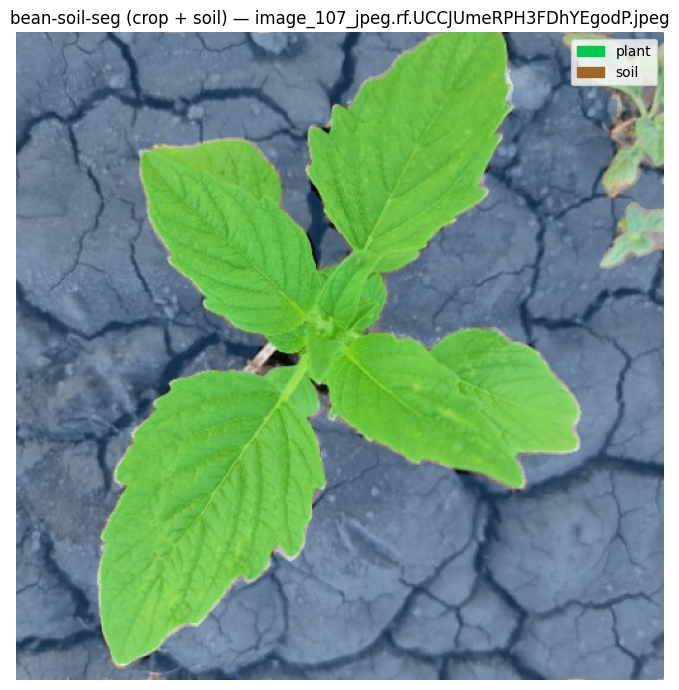

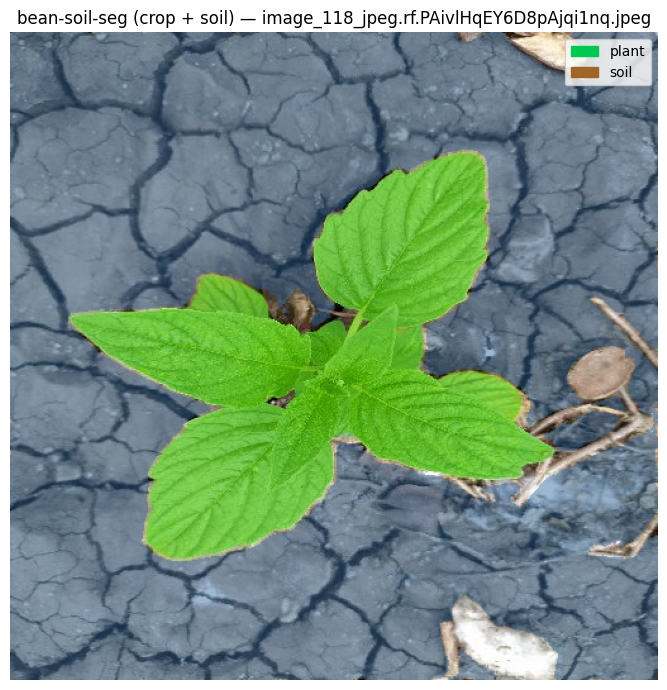

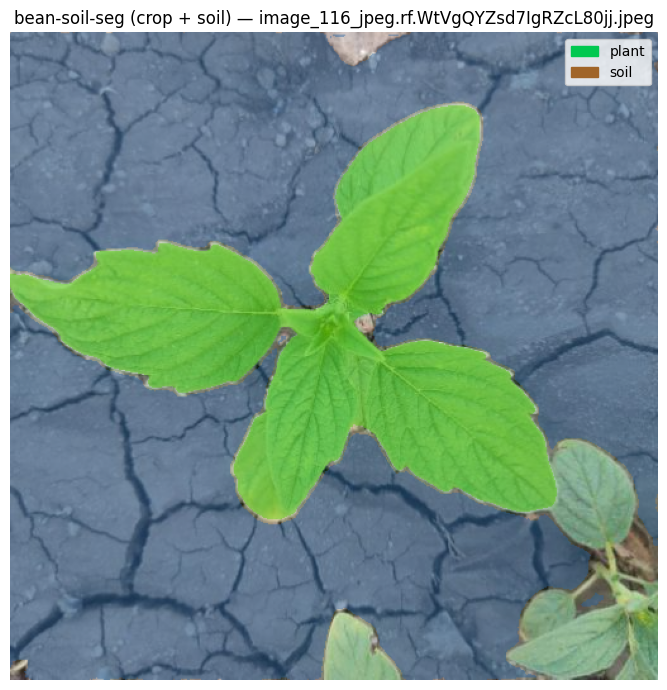

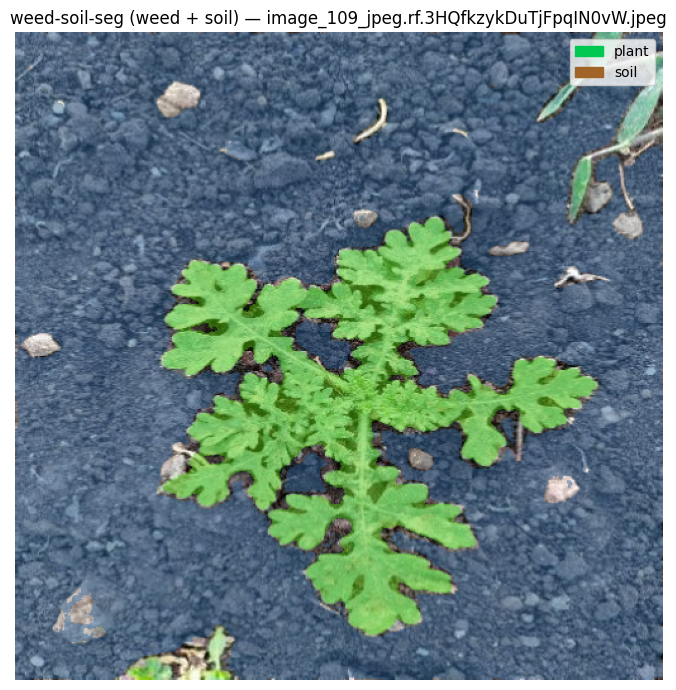

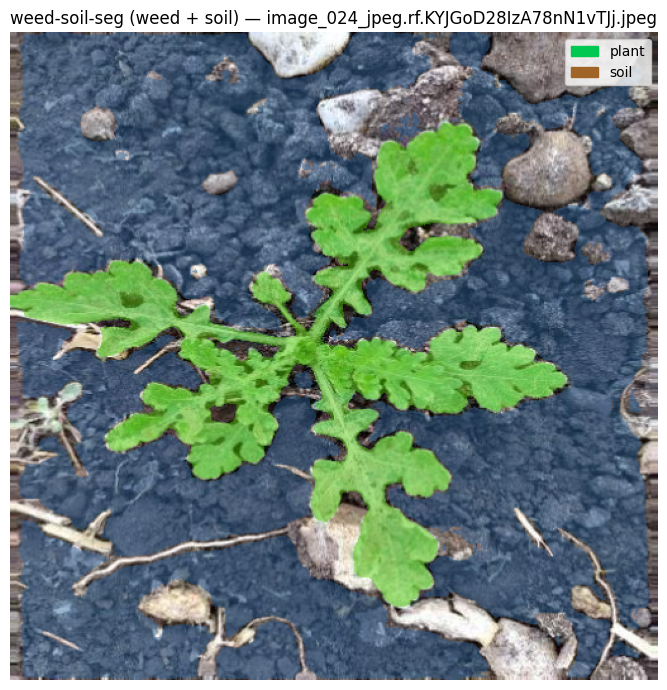

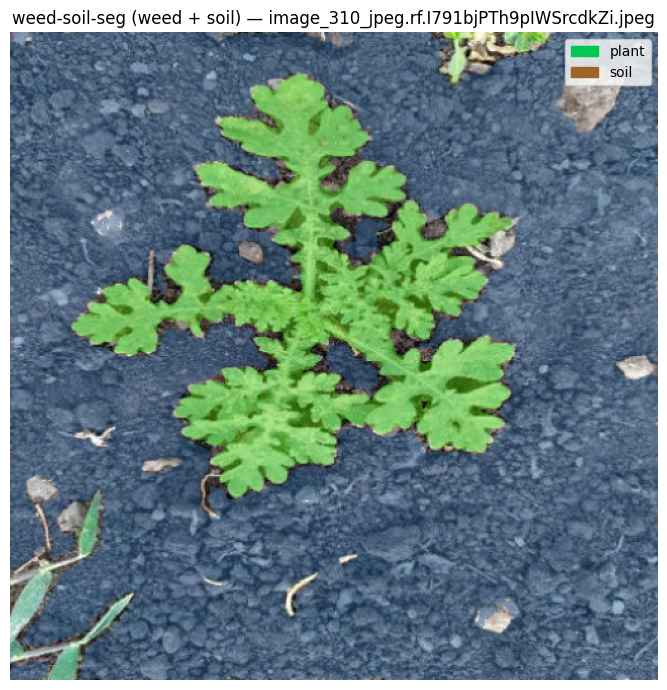

In [7]:
# Colors used only for raw COCO visualisation (before renaming to crop/weed/soil)
COCO_VIZ_COLORS = {
    1: (0, 200, 80),    # plant  → green
    2: (160, 100, 40),  # soil   → brown
}
COCO_VIZ_NAMES = {1: 'plant', 2: 'soil'}

def visualise_coco_sample(coco_data, img_dir, dataset_name, n=3):
    img_map = {img['id']: img for img in coco_data['images']}
    ann_map = {}
    for ann in coco_data['annotations']:
        ann_map.setdefault(ann['image_id'], []).append(ann)

    shown = 0
    for img_id, img_info in img_map.items():
        if shown >= n:
            break
        img_path = img_dir / img_info['file_name']
        if not img_path.exists():
            continue

        img_bgr = cv2.imread(str(img_path))
        overlay = img_bgr.copy()

        for ann in ann_map.get(img_id, []):
            seg = ann['segmentation']
            if isinstance(seg, dict) and 'counts' in seg:
                rle  = {'counts': seg['counts'], 'size': seg['size']}
                mask = coco_mask.decode(rle).astype(bool)
                color = COCO_VIZ_COLORS.get(ann['category_id'], (255, 255, 0))
                overlay[mask] = color

        blended = cv2.addWeighted(overlay, 0.45, img_bgr, 0.55, 0)
        blended = cv2.cvtColor(blended, cv2.COLOR_BGR2RGB)

        patches = [mpatches.Patch(color=[c/255 for c in COCO_VIZ_COLORS[k]],
                                  label=COCO_VIZ_NAMES[k])
                   for k in COCO_VIZ_COLORS]
        plt.figure(figsize=(7, 7))
        plt.imshow(blended)
        plt.title(f'{dataset_name} — {img_info["file_name"]}')
        plt.legend(handles=patches, loc='upper right')
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        shown += 1

visualise_coco_sample(bean_data, BEAN_SOIL_DIR, 'bean-soil-seg (crop + soil)', n=3)
visualise_coco_sample(weed_data, WEED_SOIL_DIR, 'weed-soil-seg (weed + soil)', n=3)

## Step 2: Convert COCO Segmentation → YOLO Format

YOLOv8 segmentation expects one `.txt` per image:
```
class_id  x1 y1  x2 y2  ...  xn yn   (normalised 0–1)
```

**Per-dataset COCO → YOLO class mapping:**

| Dataset | COCO category | COCO id | YOLO class | YOLO name |
|---------|--------------|---------|------------|-----------|
| bean-soil-seg | plant | 1 | **0** | crop |
| bean-soil-seg | soil  | 2 | **2** | soil |
| weed-soil-seg | plant | 1 | **1** | weed |
| weed-soil-seg | soil  | 2 | **2** | soil |

In [8]:
# YOLO class index → human name
YOLO_CLASSES = {0: 'crop', 1: 'weed', 2: 'soil'}

# Per-dataset COCO category_id → YOLO class_id
BEAN_COCO_TO_YOLO = {1: 0, 2: 2}  # plant→crop(0),  soil→soil(2)
WEED_COCO_TO_YOLO = {1: 1, 2: 2}  # plant→weed(1),  soil→soil(2)

print('YOLO classes:', YOLO_CLASSES)
print('bean-soil mapping:', BEAN_COCO_TO_YOLO)
print('weed-soil mapping:', WEED_COCO_TO_YOLO)

YOLO classes: {0: 'crop', 1: 'weed', 2: 'soil'}
bean-soil mapping: {1: 0, 2: 2}
weed-soil mapping: {1: 1, 2: 2}


In [9]:
def rle_to_polygon(rle_counts, rle_size):
    """Decode RLE mask → largest contour as flat [x, y, x, y …] list."""
    rle         = {'counts': rle_counts, 'size': rle_size}
    binary_mask = coco_mask.decode(rle)

    contours, _ = cv2.findContours(
        binary_mask.astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    if not contours:
        return None

    contour = max(contours, key=cv2.contourArea)
    epsilon  = 0.001 * cv2.arcLength(contour, True)
    polygon  = cv2.approxPolyDP(contour, epsilon, True)
    return polygon.flatten().tolist()

In [10]:
def convert_coco_annotations_to_yolo(coco_data, img_dir, out_img_dir, out_lbl_dir,
                                      coco_to_yolo, prefix=''):
    """
    Convert a full _annotations.coco.json to YOLO segmentation label files.

    Args:
        coco_data    : parsed COCO JSON dict
        img_dir      : folder containing source images
        out_img_dir  : destination for images
        out_lbl_dir  : destination for .txt label files
        coco_to_yolo : dict mapping COCO category_id → YOLO class_id
        prefix       : string prepended to output filenames to avoid collisions

    Returns:
        (converted, skipped) counts
    """
    img_map = {img['id']: img for img in coco_data['images']}
    ann_map = {}
    for ann in coco_data['annotations']:
        ann_map.setdefault(ann['image_id'], []).append(ann)

    converted = skipped = 0

    for img_id, img_info in img_map.items():
        src_img = img_dir / img_info['file_name']
        if not src_img.exists():
            skipped += 1
            continue

        w, h = img_info['width'], img_info['height']
        stem = src_img.stem

        # Copy image
        shutil.copy(src_img, out_img_dir / f'{prefix}{stem}.jpg')

        # Build YOLO label lines
        yolo_lines = []
        for ann in ann_map.get(img_id, []):
            coco_cat = ann.get('category_id')
            yolo_cls = coco_to_yolo.get(coco_cat)
            if yolo_cls is None:
                continue

            seg = ann.get('segmentation', {})

            if isinstance(seg, dict) and 'counts' in seg:
                # RLE format
                polygon = rle_to_polygon(seg['counts'], seg['size'])
                if polygon is None or len(polygon) < 6:
                    continue
                coords = polygon
            elif isinstance(seg, list) and seg:
                # Polygon format  [[x, y, x, y …]]
                coords = seg[0]
            else:
                continue

            norm = []
            for i in range(0, len(coords) - 1, 2):
                norm.extend([coords[i] / w, coords[i + 1] / h])

            yolo_lines.append(f"{yolo_cls} " + ' '.join(f'{v:.6f}' for v in norm))

        with open(out_lbl_dir / f'{prefix}{stem}.txt', 'w') as lf:
            lf.write('\n'.join(yolo_lines))

        converted += 1

    return converted, skipped

In [11]:
def prepare_yolo_dataset():
    """
    Merge both COCO datasets into a single YOLO layout:

        model_results/dataset/
            images/train/
            labels/train/
            data.yaml

    bean-soil images get prefix 'crop_', weed-soil images get prefix 'weed_'
    so there are no filename collisions.
    """
    base_dir    = model_results_dir / 'dataset'
    out_img_dir = base_dir / 'images' / 'train'
    out_lbl_dir = base_dir / 'labels' / 'train'
    out_img_dir.mkdir(parents=True, exist_ok=True)
    out_lbl_dir.mkdir(parents=True, exist_ok=True)

    total = 0

    # bean-soil-seg  →  crop (0) + soil (2)
    print('Processing bean-soil-seg  →  crop + soil …')
    with open(BEAN_SOIL_DIR / '_annotations.coco.json') as f:
        bean_coco = json.load(f)
    c, s = convert_coco_annotations_to_yolo(
        bean_coco, BEAN_SOIL_DIR, out_img_dir, out_lbl_dir,
        coco_to_yolo=BEAN_COCO_TO_YOLO, prefix='crop_'
    )
    print(f'  Converted: {c}  |  Skipped (missing image): {s}')
    total += c

    # weed-soil-seg  →  weed (1) + soil (2)
    print('Processing weed-soil-seg  →  weed + soil …')
    with open(WEED_SOIL_DIR / '_annotations.coco.json') as f:
        weed_coco = json.load(f)
    c, s = convert_coco_annotations_to_yolo(
        weed_coco, WEED_SOIL_DIR, out_img_dir, out_lbl_dir,
        coco_to_yolo=WEED_COCO_TO_YOLO, prefix='weed_'
    )
    print(f'  Converted: {c}  |  Skipped (missing image): {s}')
    total += c

    print(f'\nTotal images in merged dataset: {total}')
    print('Dataset folder:', base_dir)
    return base_dir

In [12]:
dataset_dir = prepare_yolo_dataset()

Processing bean-soil-seg  →  crop + soil …
  Converted: 65  |  Skipped (missing image): 0
Processing weed-soil-seg  →  weed + soil …
  Converted: 21  |  Skipped (missing image): 0

Total images in merged dataset: 86
Dataset folder: /content/drive/MyDrive/new_model_results/dataset


### Verify: Spot-check label files
Class 0 = crop, 1 = weed, 2 = soil. Crop images should have only 0 and 2; weed images only 1 and 2.

In [13]:
lbl_dir = dataset_dir / 'labels' / 'train'

for prefix in ('crop_', 'weed_'):
    files = sorted(lbl_dir.glob(f'{prefix}*.txt'))[:2]
    for lf in files:
        lines = lf.read_text().strip().splitlines()
        classes_found = set(l.split()[0] for l in lines if l.strip())
        print(f'{lf.name}  →  classes present: {classes_found}  ({len(lines)} annotations)')

print('\nClass legend: 0=crop  1=weed  2=soil')

crop_image_001_jpeg.rf.PvwTUI0HOwIUGEy9ewWd.txt  →  classes present: {'0', '2'}  (2 annotations)
crop_image_002_jpeg.rf.eSKD6ePguYIR3JMBZQuA.txt  →  classes present: {'0', '2'}  (2 annotations)
weed_image_002_jpeg.rf.nt72bQKVTcDGOoZDhghj.txt  →  classes present: {'1', '2'}  (2 annotations)
weed_image_008_jpeg.rf.GZm1MoxtRYq1E6RhQbgV.txt  →  classes present: {'1', '2'}  (2 annotations)

Class legend: 0=crop  1=weed  2=soil


## Step 3: Create Dataset Configuration (`data.yaml`)

In [14]:
data_yaml = f"""# Crop-Weed-Soil Segmentation Dataset
path: {dataset_dir}   # absolute path to dataset root
train: images/train
val:   images/train   # small dataset — replace with a separate val split when available

nc: 3
names:
  0: crop
  1: weed
  2: soil
"""

yaml_path = dataset_dir / 'data.yaml'
yaml_path.write_text(data_yaml)

print('data.yaml saved to:', yaml_path)
print()
print(data_yaml)

data.yaml saved to: /content/drive/MyDrive/new_model_results/dataset/data.yaml

# Crop-Weed-Soil Segmentation Dataset
path: /content/drive/MyDrive/new_model_results/dataset   # absolute path to dataset root
train: images/train
val:   images/train   # small dataset — replace with a separate val split when available

nc: 3
names:
  0: crop
  1: weed
  2: soil



## Step 4: Load YOLOv8-Seg Base Model

In [15]:
import requests

base_model_name = 'yolov8n-seg.pt'
target_path     = model_results_dir / base_model_name

if not target_path.exists():
    print(f'Downloading {base_model_name} …')
    url = f'https://github.com/ultralytics/assets/releases/download/v8.4.0/{base_model_name}'
    try:
        r = requests.get(url, stream=True)
        r.raise_for_status()
        with open(target_path, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)
        print('Download complete.')
    except Exception as e:
        print(f'Direct download failed ({e}); using Ultralytics auto-download.')
        model = YOLO(base_model_name)
else:
    print(f'{base_model_name} already present at {target_path}')

if 'model' not in dir():
    model = YOLO(str(target_path))

print('Model ready.')

Download complete.
Model ready.


## Step 5: Train the Model

The merged dataset has ~86 images across 3 classes. Augmentation is tuned to compensate for the small size.

In [16]:
EPOCHS     = 150
IMG_SIZE   = 640
BATCH_SIZE = 8    # reduce to 4 if GPU runs out of memory
PATIENCE   = 30   # early-stopping patience

train_results = model.train(
    data     = str(yaml_path),
    epochs   = EPOCHS,
    imgsz    = IMG_SIZE,
    batch    = BATCH_SIZE,
    name     = 'crop_weed_soil_seg',
    patience = PATIENCE,
    save     = True,
    device   = '0',    # use 'cpu' if no GPU available
    plots    = True,
    verbose  = True,
    project  = str(model_results_dir),
    # Augmentation — helps generalise with a small dataset
    degrees  = 15,
    flipud   = 0.3,
    fliplr   = 0.5,
    hsv_h    = 0.015,
    hsv_s    = 0.5,
    hsv_v    = 0.3,
    mosaic   = 0.5,
)

Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/new_model_results/dataset/data.yaml, degrees=15, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.3, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.5, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/new_model_results/yolov8n-seg.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, name=crop_weed_soil_seg, nbs=64, nms=

## Step 6: Validate the Trained Model

In [17]:
metrics = model.val()

print('\n── Overall Validation Metrics ──')
print(f'  Box  mAP50    : {metrics.box.map50:.4f}')
print(f'  Box  mAP50-95 : {metrics.box.map:.4f}')
print(f'  Seg  mAP50    : {metrics.seg.map50:.4f}')
print(f'  Seg  mAP50-95 : {metrics.seg.map:.4f}')

Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8n-seg summary (fused): 86 layers, 3,258,649 parameters, 0 gradients, 11.3 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 23.9±4.2 MB/s, size: 52.9 KB)
val: Scanning /content/drive/MyDrive/new_model_results/dataset/labels/train.cache... 86 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 86/86 24.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.3s/it 7.7s
                   all         86        176      0.967      0.943      0.991      0.944      0.957      0.933       0.98      0.907
                  crop         65         67      0.937          1      0.995      0.962      0.909       0.97      0.962       0.96
                  weed         21         22      0.977      0.955      0.993      0.989      0.977      0.955      0.993       0.92
                  soi

In [18]:
metrics_file = model_results_dir / 'validation_metrics.txt'
with open(metrics_file, 'a') as f:
    f.write('── crop_weed_soil_seg ──\n')
    f.write(f'Box  mAP50    : {metrics.box.map50:.4f}\n')
    f.write(f'Box  mAP50-95 : {metrics.box.map:.4f}\n')
    f.write(f'Seg  mAP50    : {metrics.seg.map50:.4f}\n')
    f.write(f'Seg  mAP50-95 : {metrics.seg.map:.4f}\n\n')
print('Metrics appended to:', metrics_file)

Metrics appended to: /content/drive/MyDrive/new_model_results/validation_metrics.txt


## Step 7: Plot Training Curves

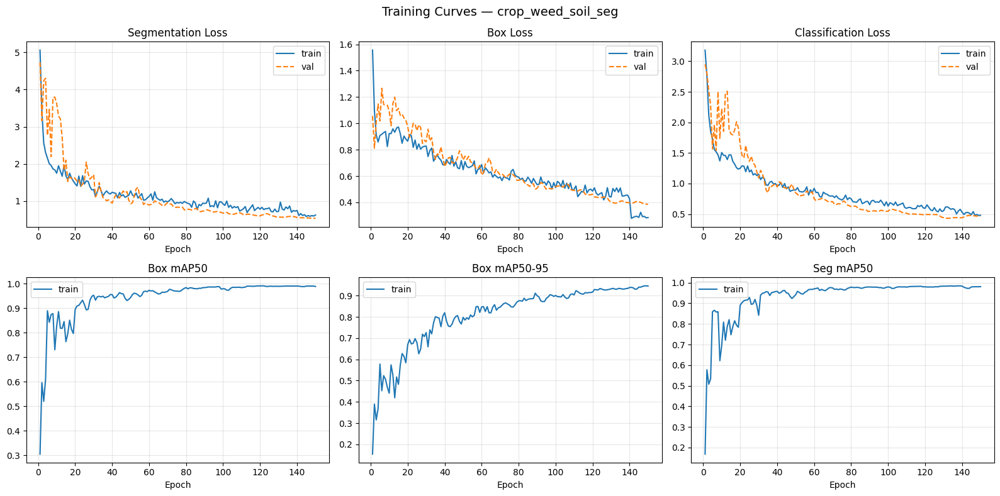

Saved to: /content/drive/MyDrive/new_model_results/training_curves.png


In [19]:
results_csv = model_results_dir / 'crop_weed_soil_seg' / 'results.csv'

if results_csv.exists():
    import pandas as pd
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()

    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    fig.suptitle('Training Curves — crop_weed_soil_seg', fontsize=14)

    pairs = [
        ('train/seg_loss',   'val/seg_loss',    'Segmentation Loss'),
        ('train/box_loss',   'val/box_loss',    'Box Loss'),
        ('train/cls_loss',   'val/cls_loss',    'Classification Loss'),
        ('metrics/mAP50(B)', None,              'Box mAP50'),
        ('metrics/mAP50-95(B)', None,           'Box mAP50-95'),
        ('metrics/mAP50(M)', None,              'Seg mAP50'),
    ]

    for ax, (train_col, val_col, title) in zip(axes.flat, pairs):
        if train_col in df.columns:
            ax.plot(df['epoch'], df[train_col], label='train')
        if val_col and val_col in df.columns:
            ax.plot(df['epoch'], df[val_col], label='val', linestyle='--')
        ax.set_title(title)
        ax.set_xlabel('Epoch')
        ax.legend()
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    curve_png = model_results_dir / 'training_curves.png'
    plt.savefig(curve_png, dpi=120)
    plt.show()
    print('Saved to:', curve_png)
else:
    print('results.csv not found — training may not have completed.')

## Step 8: Test on Sample Images
Runs inference on images from both crop and weed subsets.


image 1/1 /content/drive/MyDrive/new_model_results/dataset/images/train/crop_image_001_jpeg.rf.PvwTUI0HOwIUGEy9ewWd.jpg: 640x640 1 crop, 2 soils, 13.3ms
Speed: 5.8ms preprocess, 13.3ms inference, 10.1ms postprocess per image at shape (1, 3, 640, 640)


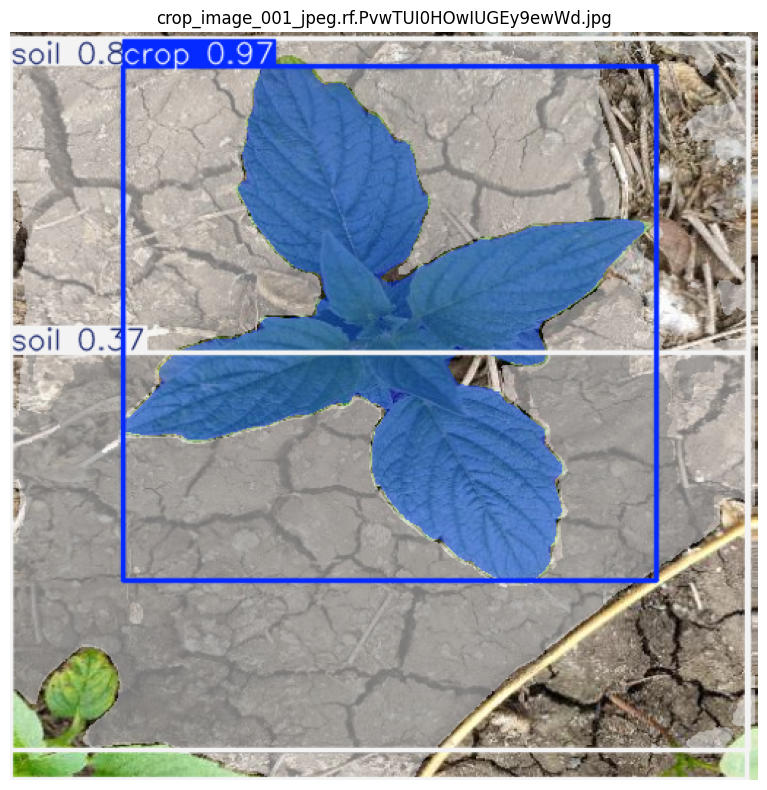


image 1/1 /content/drive/MyDrive/new_model_results/dataset/images/train/crop_image_002_jpeg.rf.eSKD6ePguYIR3JMBZQuA.jpg: 640x640 1 crop, 1 soil, 17.0ms
Speed: 7.1ms preprocess, 17.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


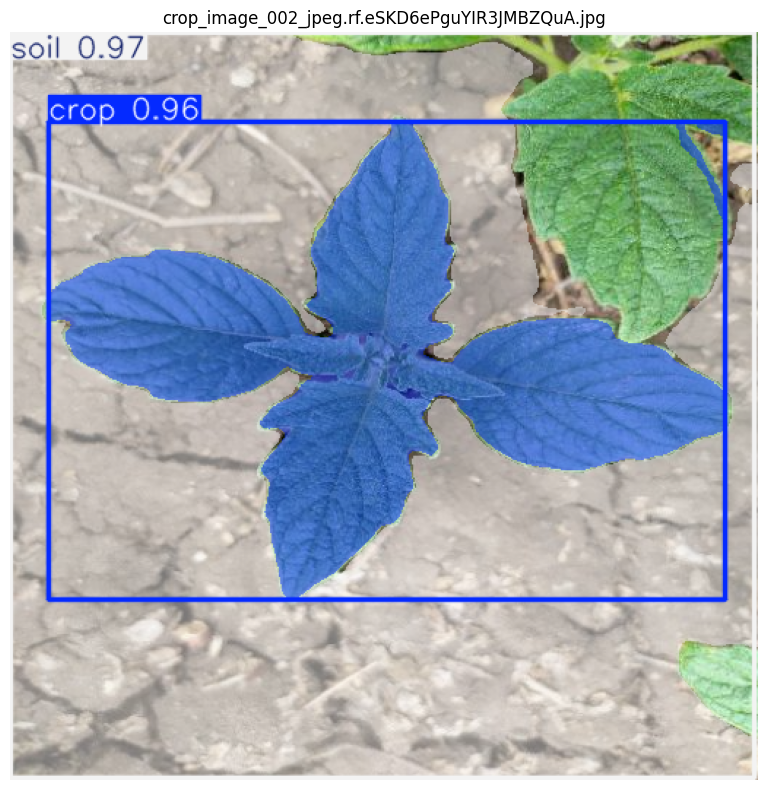


image 1/1 /content/drive/MyDrive/new_model_results/dataset/images/train/crop_image_003_jpeg.rf.Bufgqd7LcHXlBsjbvrRP.jpg: 640x640 2 crops, 1 soil, 12.7ms
Speed: 4.1ms preprocess, 12.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


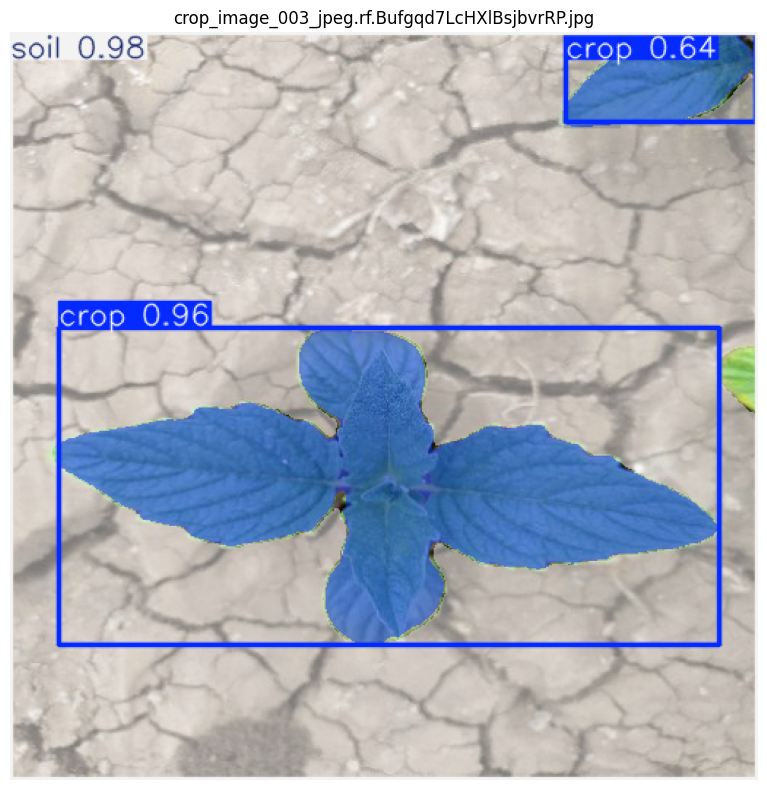


image 1/1 /content/drive/MyDrive/new_model_results/dataset/images/train/weed_image_002_jpeg.rf.nt72bQKVTcDGOoZDhghj.jpg: 640x640 2 weeds, 1 soil, 15.1ms
Speed: 3.9ms preprocess, 15.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


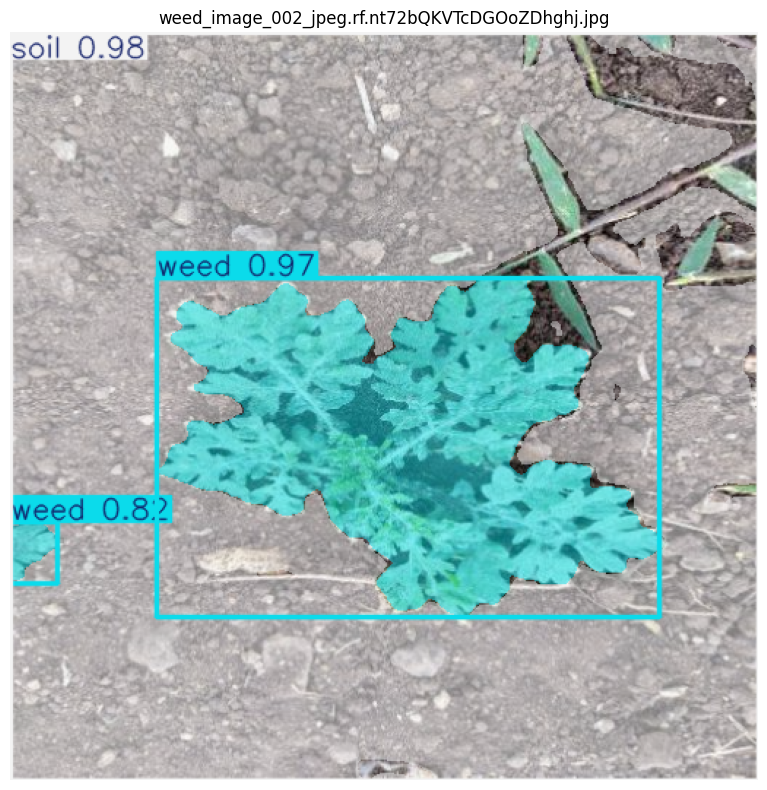


image 1/1 /content/drive/MyDrive/new_model_results/dataset/images/train/weed_image_008_jpeg.rf.GZm1MoxtRYq1E6RhQbgV.jpg: 640x640 1 weed, 1 soil, 22.5ms
Speed: 10.4ms preprocess, 22.5ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)


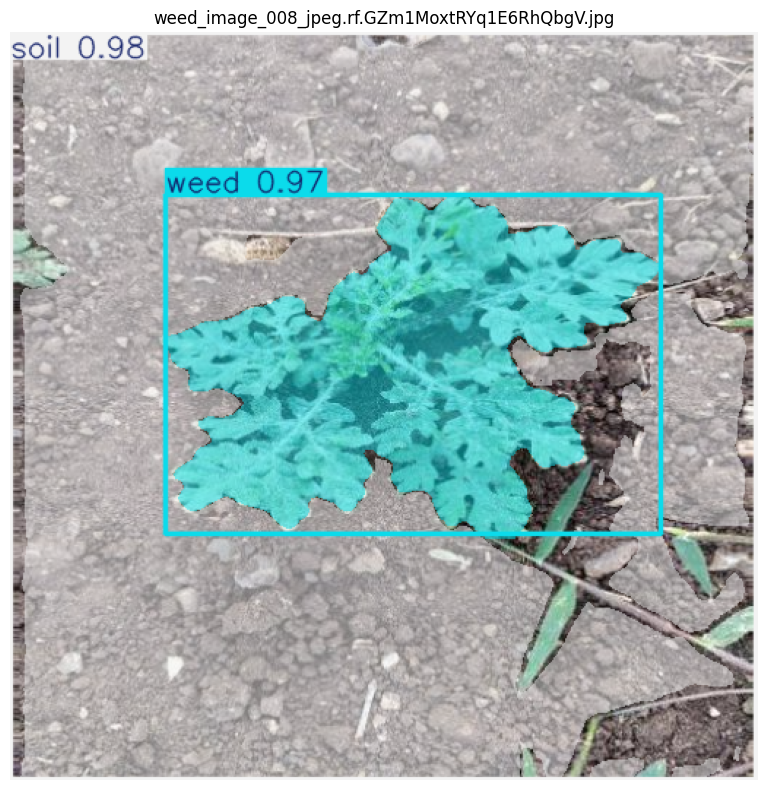


image 1/1 /content/drive/MyDrive/new_model_results/dataset/images/train/weed_image_016_jpeg.rf.gowlq7bnOnRaMPqnwwUr.jpg: 640x640 2 weeds, 1 soil, 15.5ms
Speed: 5.8ms preprocess, 15.5ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


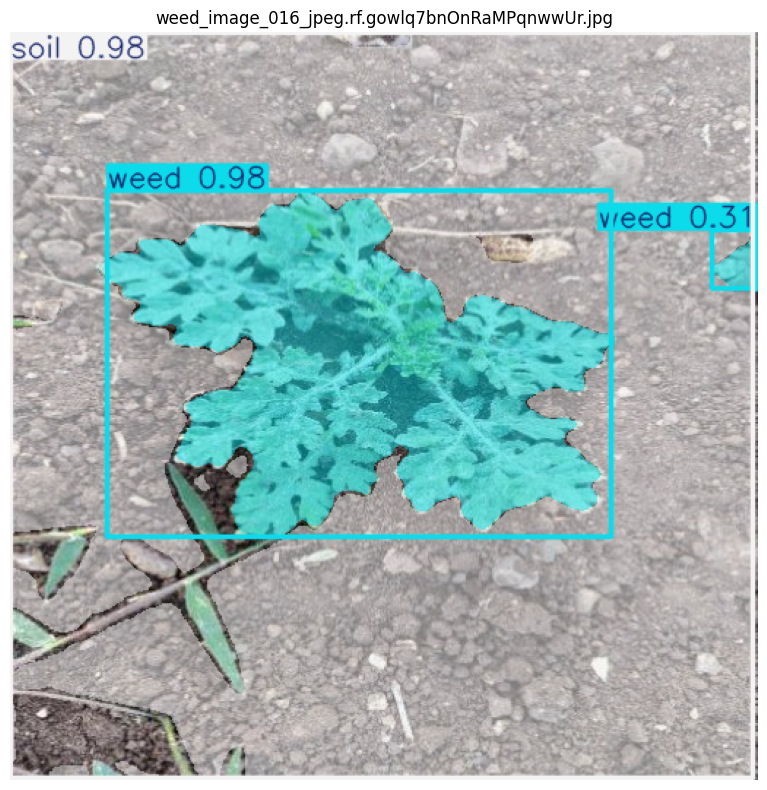

In [20]:
best_model_path = model_results_dir / 'crop_weed_soil_seg' / 'weights' / 'best.pt'
best_model      = YOLO(str(best_model_path))

img_dir     = dataset_dir / 'images' / 'train'
crop_imgs   = sorted(img_dir.glob('crop_*.jpg'))[:3]
weed_imgs   = sorted(img_dir.glob('weed_*.jpg'))[:3]
test_images = crop_imgs + weed_imgs

for img_path in test_images:
    preds = best_model.predict(source=str(img_path), conf=0.25, save=False, plots=False)
    for r in preds:
        im_rgb = cv2.cvtColor(r.plot(), cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(8, 8))
        plt.imshow(im_rgb)
        plt.title(img_path.name)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

## Step 9: Per-Class Segmentation Metrics

In [21]:
val_metrics = best_model.val()

print('\n── Per-Class Segmentation AP ──')
for cls_id, cls_name in YOLO_CLASSES.items():
    try:
        ap50    = val_metrics.seg.ap50[cls_id]
        ap50_95 = val_metrics.seg.ap[cls_id]
        print(f'  [{cls_id}] {cls_name:<6}  mAP50={ap50:.4f}  mAP50-95={ap50_95:.4f}')
    except (IndexError, AttributeError):
        print(f'  [{cls_id}] {cls_name}: metric unavailable')

Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.8±0.9 ms, read: 14.7±4.9 MB/s, size: 68.9 KB)
val: Scanning /content/drive/MyDrive/new_model_results/dataset/labels/train.cache... 86 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 86/86 19.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.2s/it 7.1s
                   all         86        176      0.967      0.943      0.991      0.944      0.957      0.933       0.98      0.907
                  crop         65         67      0.937          1      0.995      0.962      0.909       0.97      0.962       0.96
                  weed         21         22      0.977      0.955      0.993      0.989      0.977      0.955      0.993       0.92
                  soil         86         87      0.986      0.874      0.984      0.882      0.986      0.8

## Step 10: Export Model for Deployment

In [22]:
# Export to ONNX — runs on CPU, Jetson, OpenCV, etc.
best_model.export(format='onnx', dynamic=False, simplify=True)

onnx_path = best_model_path.parent / 'best.onnx'
if onnx_path.exists():
    print('ONNX model saved to:', onnx_path)
else:
    print('ONNX file not found — check the weights folder.')

Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/content/drive/MyDrive/new_model_results/crop_weed_soil_seg/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 39, 8400), (1, 32, 160, 160)) (6.5 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 328ms
Prepared 4 packages in 1.41s
Installed 4 packages in 410ms
 + colorama==0.4.6
 + onnx==1.21.0
 + onnxruntime==1.26.0
 + onnxslim==0.1.94

requirements: AutoUpdate success ✅ 2.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.21.0 opset 20...
ONNX: slimming with onnxslim 0.1.94...
ONNX: 

## Summary

| Item | Detail |
|------|--------|
| Model | YOLOv8n-seg |
| Classes | crop (0), weed (1), soil (2) |
| Training images | ~86 (65 crop + 21 weed) |
| Annotation input | COCO RLE masks → YOLO polygon coordinates |
| Weights | `model_results/crop_weed_soil_seg/weights/best.pt` |
| ONNX export | `model_results/crop_weed_soil_seg/weights/best.onnx` |

**Class definitions:**
- **Class 0 — crop**: bean plant instances from `bean-soil-seg` dataset
- **Class 1 — weed**: weed plant instances from `weed-soil-seg` dataset
- **Class 2 — soil**: soil regions from **both** datasets